- Load the data
- Load a model
- Run the prediction

- Run statistical tests:
    - std in time?
    - flux in time
    - combine only part of the night for the residual
    - residuals with new std normalization

# Imports

In [103]:
import json
import sys
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt

from s4hci.utils.data_handling import load_adi_data, save_as_fits
from s4hci.models.psf_subtraction import S4
from s4hci.models.noise import S4Noise
from s4hci.utils.logging import print_message, setup_logger

from applefy.utils.fake_planets import add_fake_planets
from s4hci.utils.adi_tools import combine_residual_stack

# Load the data

In [62]:
#dataset_hdf5_file_new = "/fast/mbonse/s4/30_data/HD22049_304_199_C-0065_C_.hdf5"
#dataset_hdf5_file_new = "/fast/mbonse/s4/30_data/HD22049_303_199_C-0065_C_.hdf5"

dataset_hdf5_file_new = "/fast/mbonse/s4/30_data/HD22049_304_199_C-0065_C_.hdf5"
dataset_hdf5_file_old = "/fast/mbonse/s4/30_data/old_datasets/EpsEri_199_C-0065-C_2017-10-31.hdf5"

#dataset_hdf5_file_new = "/fast/mbonse/s4/30_data/HD22049_310_0100_C-0656_A_.hdf5"
#dataset_hdf5_file_old = "/fast/mbonse/s4/30_data/old_datasets/EpsEri_0100_C-0656-A.hdf5"

s4_work_dir = "/fast/mbonse/s4/70_results/03_contrast_grid/explain_pattern/"

In [63]:
science_data_old, raw_angles_old, psf_template_data_old = \
    load_adi_data(
        hdf5_dataset=dataset_hdf5_file_old,
        data_tag="13_object_final",
        psf_template_tag="10_psf",
        para_tag="header_13_object_final/PARANG")

science_data_new, raw_angles_new, psf_template_data_new = \
    load_adi_data(
        hdf5_dataset=dataset_hdf5_file_new,
        data_tag="object",
        psf_template_tag="psf_template",
        para_tag="header_object/PARANG")

In [64]:
science_data_new = science_data_new[:, 12:-12, 12:-12]

# Background subtraction of the PSF template
psf_template_data_new = np.median(psf_template_data_new, axis=0)
psf_template_data_new = psf_template_data_new - np.min(psf_template_data_new)

# Background subtraction of the PSF template
psf_template_data_old = np.median(psf_template_data_old, axis=0)
psf_template_data_old = psf_template_data_old - np.min(psf_template_data_old)

In [65]:
science_data_new.shape

(57561, 117, 117)

In [66]:
science_data_old.shape

(59820, 107, 107)

# Some tests directly on the data

In [68]:
data = science_data_new - np.mean(science_data_new, axis=0)
data = data / np.std(science_data_new, axis=0)
center = 58

In [72]:
data = science_data_old - np.mean(science_data_old, axis=0)
data = data / np.std(science_data_old, axis=0)
center = 53

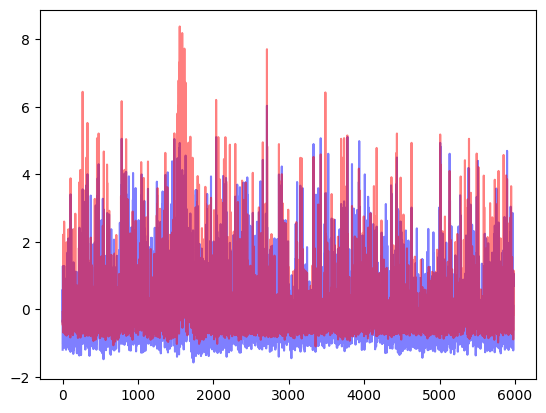

In [73]:
plt.plot(data[::10, center+1, center], color="blue", alpha=0.5)
#plt.plot(data[::10, 58, 57], color="blue", alpha=0.5)

plt.plot(data[::10, center, center], color="red", alpha=0.5)

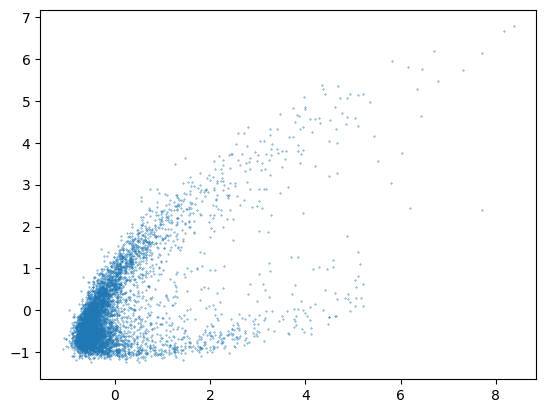

In [74]:
plt.scatter(data[::10, center, center], data[::10, center, center-1], s=0.1)

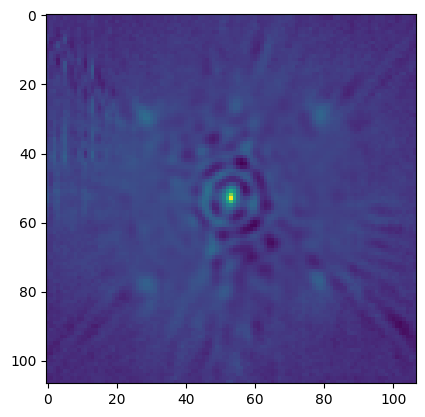

In [78]:
correlation = np.mean((data[::10] * data[::10, center, center, np.newaxis, np.newaxis]), axis=0)
plt.imshow(correlation)

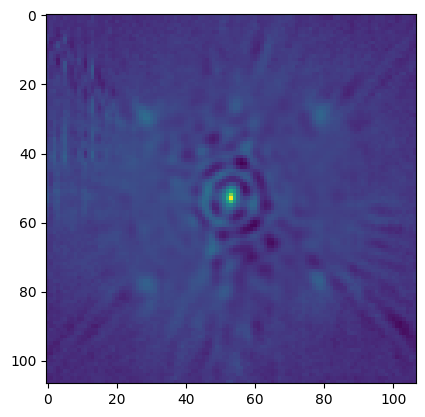

In [75]:
correlation = np.mean((data[::10] * data[::10, center, center, np.newaxis, np.newaxis]), axis=0)
plt.imshow(correlation)

# Restore the model

In [81]:
s4_model = S4(
    data_cube=science_data_new,
    parang=raw_angles_new,
    psf_template=psf_template_data_new,
    noise_noise_cut_radius_psf=4.0,
    noise_mask_radius=5.5,
    device=0,
    noise_lambda_init=1934,
    planet_convolve_second=True,
    planet_use_up_sample=1,
    work_dir=s4_work_dir,
    verbose=True)

Creating right reason mask ... [DONE]


In [82]:
noise_model = "/fast/mbonse/s4/70_results/03_contrast_grid/finished/HD22049_304_199_C-0065_C_/results/0000/models/noise_model_closed_form.pkl"
s4_noise = S4Noise.load(noise_model)

Creating right reason mask ... [DONE]


In [83]:
s4_model.noise_model = s4_noise.float()

# Compute a test residual

In [84]:
import torch

In [85]:
residual_before_fine_tuning = s4_model.compute_residual(
            account_for_planet=False,
            combine="mean")

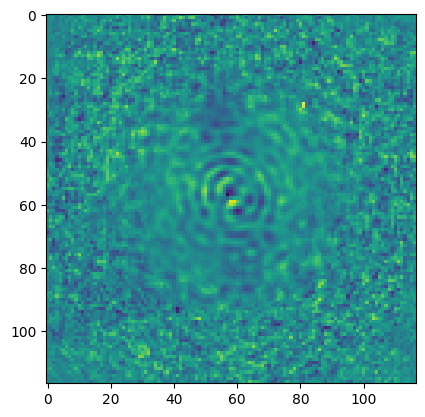

In [86]:
plt.imshow(residual_before_fine_tuning)

# Compute the residual step by step

In [185]:
x_train = torch.from_numpy(s4_model.data_cube).float()

In [186]:
#x_train[:, 58, 58]  = x_train[:, 58, 57] 
data_no_planet = x_train

In [187]:
# 4.) Set up the normalization
x_mu = torch.mean(data_no_planet, axis=0)
x_std = torch.std(data_no_planet, axis=0)

In [188]:
# 5.) get the current normalized data
x_norm = (x_train - x_mu) / x_std
x_no_planet = (data_no_planet - x_mu) / x_std

In [173]:
for i in range(center - 1, center + 2, 1):
    for j in range(center - 1, center + 2, 1):
    
        x_no_planet[:,i, j] = 0

In [189]:
x_no_planet[:,center, center] = 0

In [190]:
# 6.) reshape everything
science_norm_flatten = x_norm.view(x_norm.shape[0], -1).float()
science_norm_flatten_no_planet = x_no_planet.view(x_norm.shape[0], -1).float()

In [191]:
# 7.) compute the noise estimate
noise_estimate = s4_model.noise_model(science_norm_flatten_no_planet)

In [192]:
# 8.) compute the residual sequence
residual_sequence = science_norm_flatten - noise_estimate
residual_stack = residual_sequence.view(
    x_train.shape[0],
    s4_model.noise_model.image_size,
    s4_model.noise_model.image_size).detach().cpu().numpy()

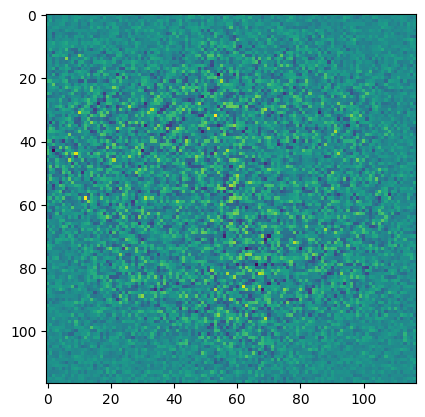

In [193]:
plt.imshow(np.mean(residual_stack, axis=0))

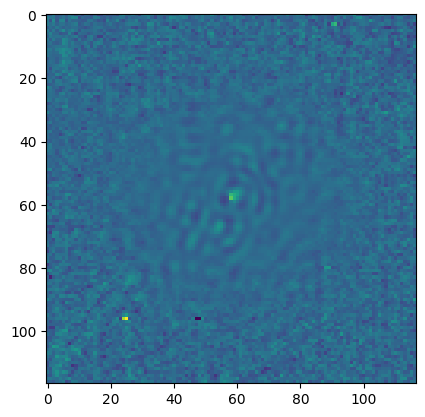

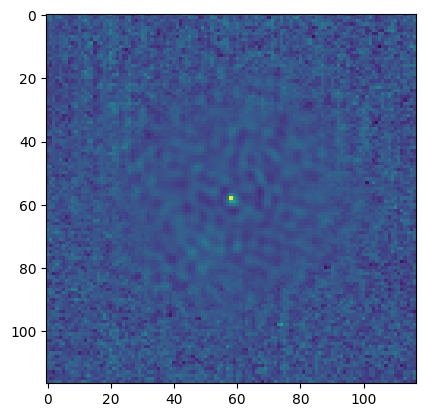

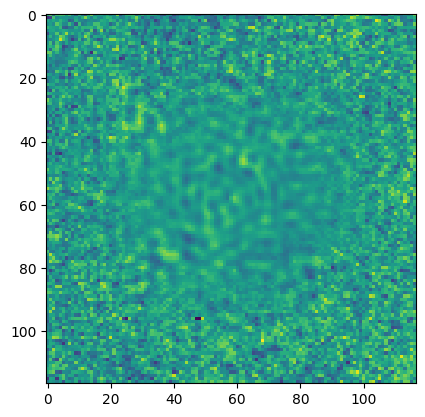

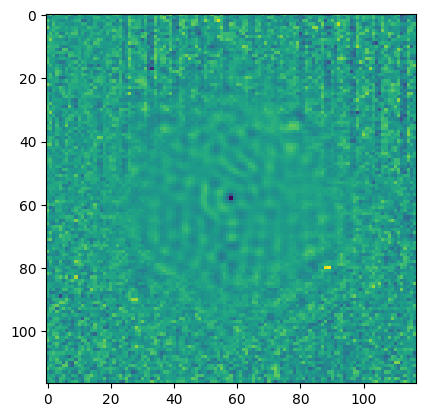

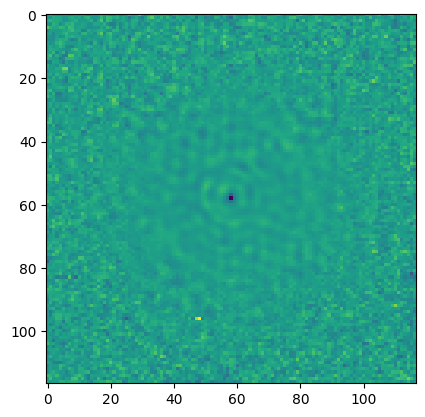

...

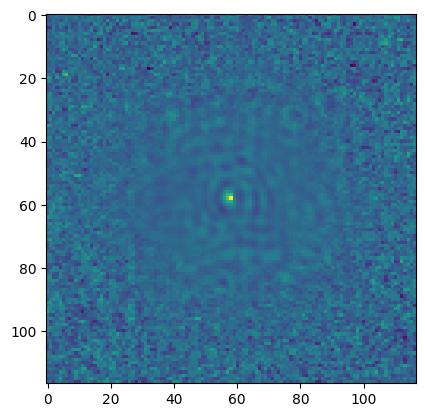

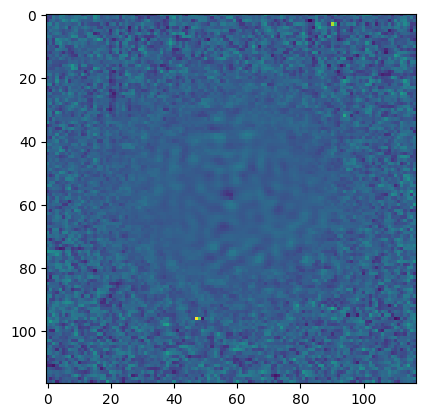

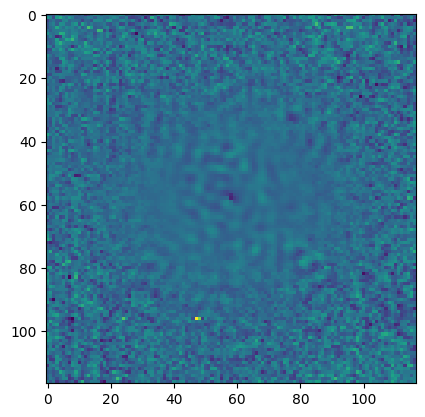

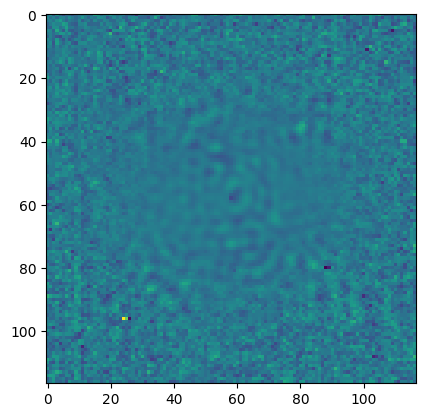

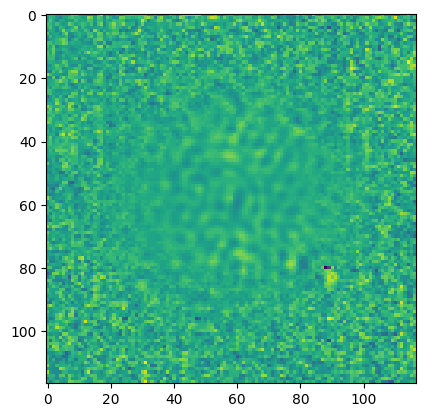

In [194]:
for i in range(2000, 50000, 2000):
    plt.imshow(np.mean(residual_stack[i:i+500], axis=0))
    plt.show()

# Check correlations in the residual stack

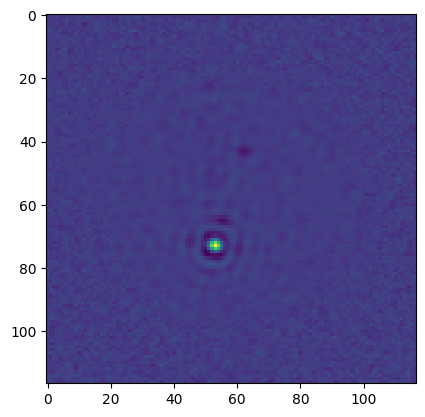

In [179]:
correlation = np.mean((residual_stack[::10] * 
                       residual_stack[::10, center+20, center, np.newaxis, np.newaxis]), axis=0)
plt.imshow(correlation)

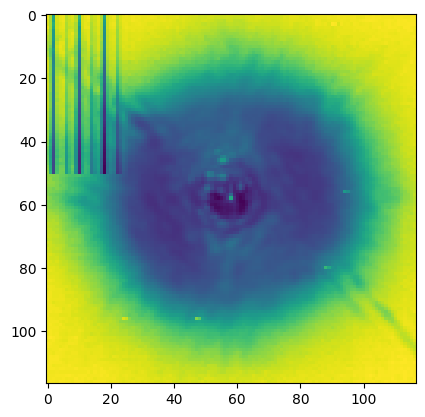

In [180]:
plt.imshow(np.std(residual_stack, axis=0))

# Test some residuals

In [197]:
residual_1 = combine_residual_stack(
    residual_stack=residual_stack,
    angles=s4_model.parang,
    combine=["Mean_Residuals", ],
    suffix="",
    num_cpus=20)["Mean_Residuals"]

In [137]:
residual_2 = combine_residual_stack(
    residual_stack=residual_stack,
    angles=s4_model.parang,
    combine=["Mean_Residuals", ],
    suffix="",
    num_cpus=20)["Mean_Residuals"]

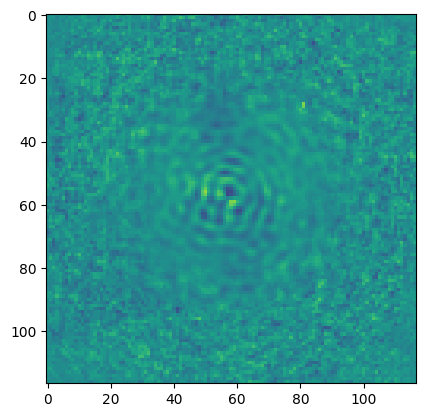

In [198]:
plt.imshow(residual_1, vmin=-0.03, vmax=0.03)

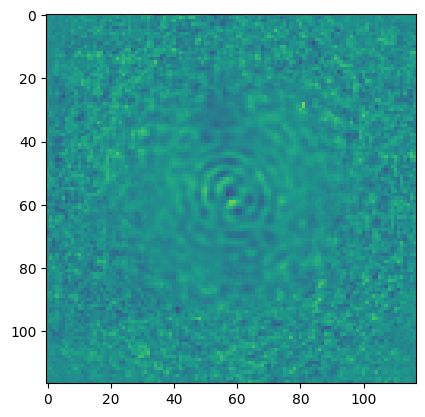

In [138]:
plt.imshow(residual_2, vmin=-0.03, vmax=0.03)

## Create some residuals

In [38]:
from s4hci.utils.adi_tools import combine_residual_stack

In [22]:
residual_1 = combine_residual_stack(
    residual_stack=(residual_stack - np.mean(residual_stack, axis=0)) / std_map,
    angles=s4_model.parang,
    combine=["Mean_Residuals", ],
    suffix="",
    num_cpus=20)["Mean_Residuals"]

In [60]:
residual_2 = combine_residual_stack(
    residual_stack=residual_stack,
    angles=s4_model.parang,
    combine=["Mean_Residuals", ],
    suffix="",
    num_cpus=20)["Mean_Residuals"]

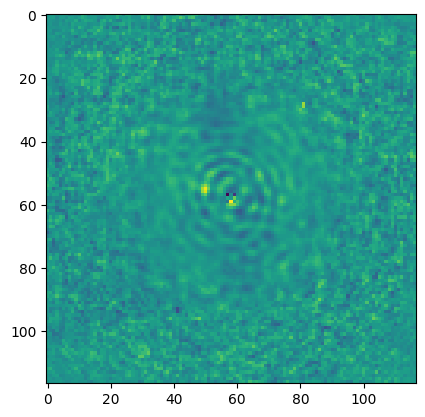

In [61]:
plt.imshow(residual_2)

In [24]:
residual_3 = combine_residual_stack(
    residual_stack=residual_stack[0:200:2],
    angles=s4_model.parang[0:200:2],
    combine=["Mean_Residuals", ],
    suffix="",
    num_cpus=20)["Mean_Residuals"]

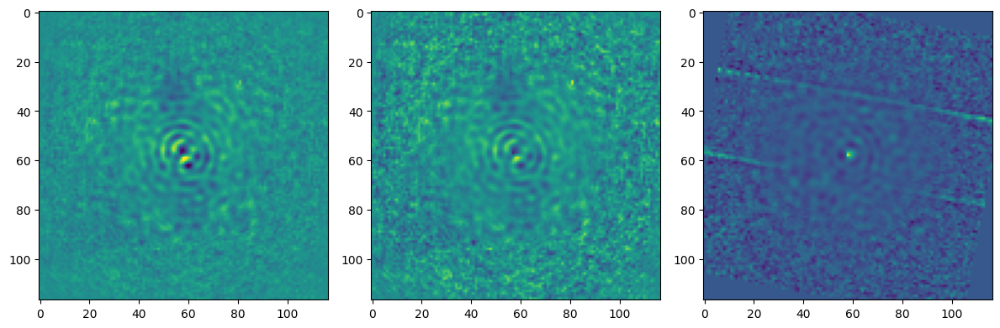

In [25]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 8))
ax1.imshow(residual_1, vmin=-0.05, vmax = 0.05)
ax2.imshow(residual_2, vmin=-0.02, vmax = 0.02)
ax3.imshow(residual_3)#, vmin=-0.02, vmax = 0.02)

plt.tight_layout()

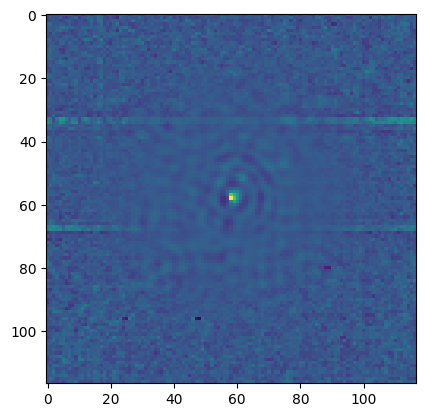

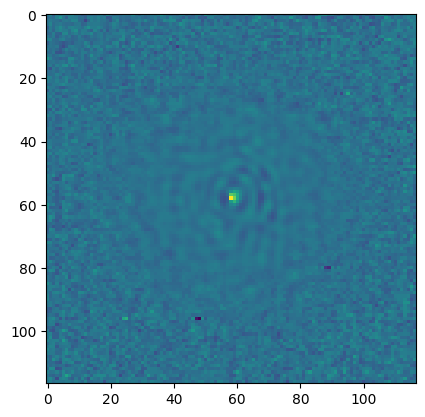

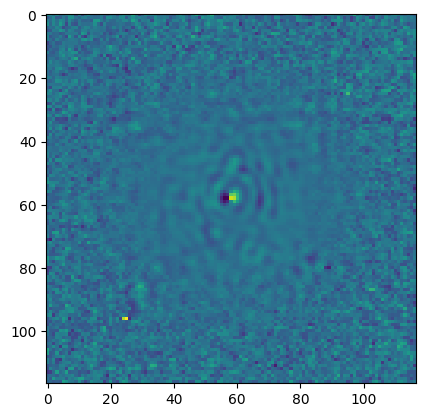

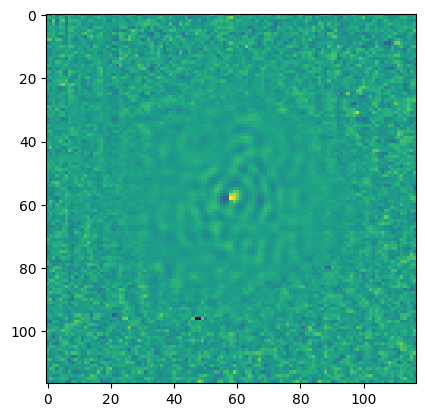

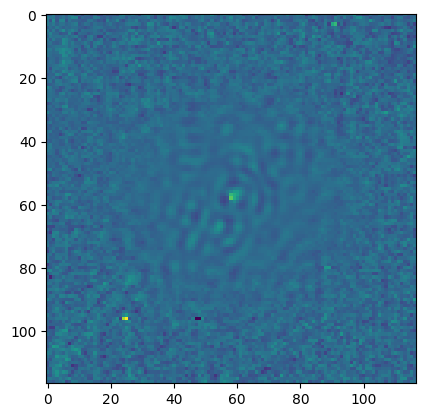

...

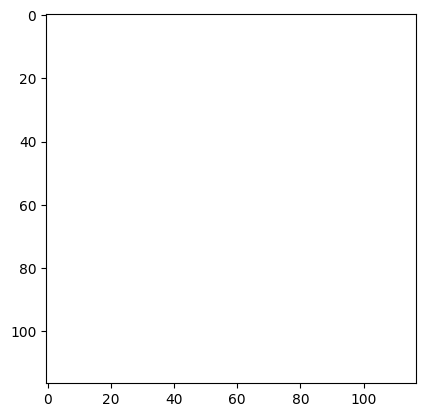

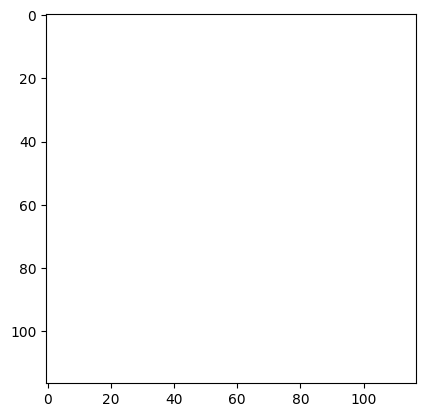

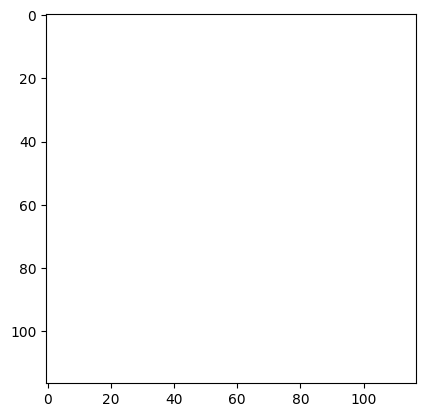

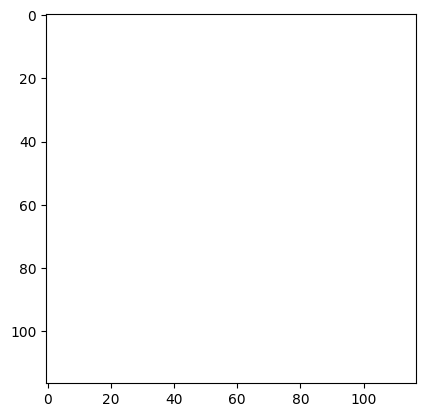

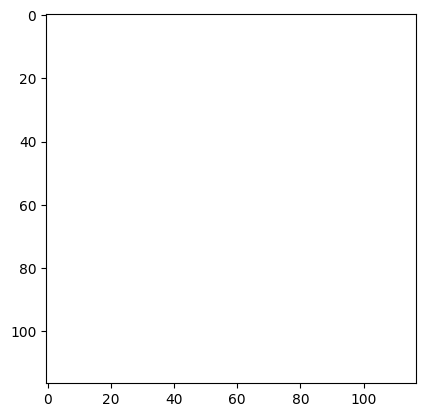

In [55]:
for i in range(0, 80000, 500):
    plt.imshow(np.mean(residual_stack[i:i+500], axis=0))
    plt.show()